<a href="https://colab.research.google.com/github/AsyrofiAnam/DeepLearning/blob/main/Yolov8%2BDeepsort_AntrianPelangganFC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install ultralytics
!pip install roboflow
!pip install deep_sort_realtime opencv-python-headless
!pip install -q albumentations opencv-python

In [2]:
import ultralytics
ultralytics.checks()

import os
import cv2
import numpy as np
import time
from ultralytics import YOLO
from matplotlib import pyplot as plt
from roboflow import Roboflow
from deep_sort_realtime.deepsort_tracker import DeepSort
from glob import glob
from tqdm import tqdm

Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.1/112.6 GB disk)


In [3]:
rf = Roboflow(api_key="N9notXeosIEWuodSSsuJ")
project = rf.workspace("tugas-5-deep-learning").project("penghitunganantrianpelangganfc")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PenghitunganAntrianPelangganFC-1 in yolov8:: 100%|██████████| 4812/4812 [00:00<00:00, 5925.14it/s]


In [4]:
!yolo task=detect mode=train model=yolov8n.pt data=PenghitunganAntrianPelangganFC-1/data.yaml epochs=50 imgsz=640

100% 6.25M/6.25M [00:00<00:00, 375MB/s]
Ultralytics 8.3.146 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=PenghitunganAntrianPelangganFC-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=1

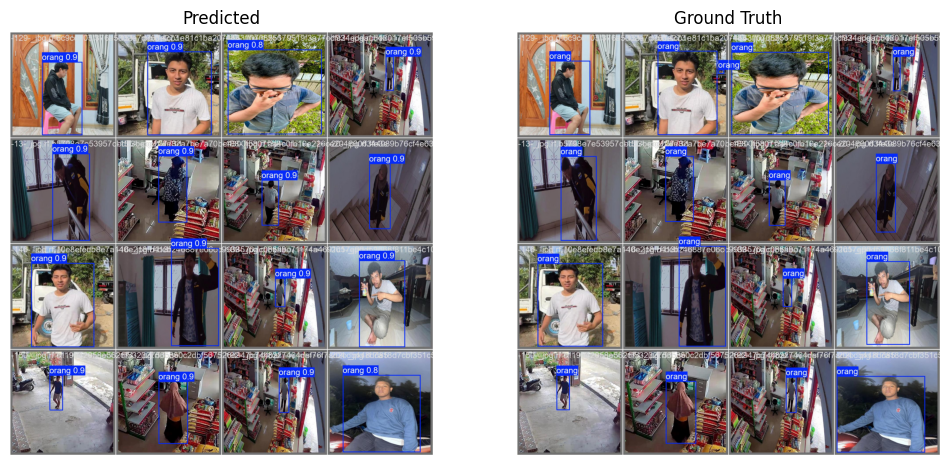

In [5]:
from PIL import Image
pred = Image.open("runs/detect/train/val_batch1_pred.jpg")
labels = Image.open("runs/detect/train/val_batch1_labels.jpg")

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(pred)
plt.axis('off')
plt.title("Predicted")

plt.subplot(1, 2, 2)
plt.imshow(labels)
plt.axis('off')
plt.title("Ground Truth")

plt.show()

In [6]:
import shutil
shutil.make_archive("runs_yolo", "zip", "runs")

'/content/runs_yolo.zip'

In [7]:
model = YOLO("runs/detect/train/weights/best.pt")

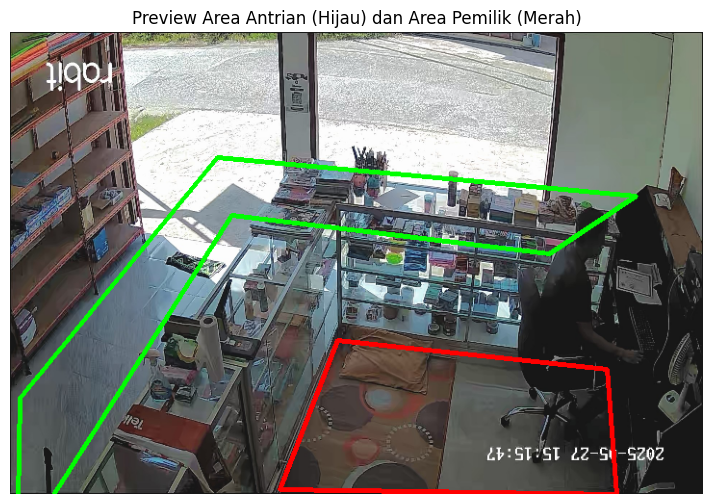

In [8]:
image = cv2.imread("previewcctv.jpg")
image = cv2.resize(image, (720, 480))

# === Area Antrian ===
antrian_area_pts = np.array([
    [215, 130],    # pojok kiri atas
    [650, 170],    # atas kanan (etalase)
    [560, 230],    # bawah etalase
    [230, 190],    # batas horizontal tengah (digeser sesuai feedback)
    [7, 540],      # batas vertikal kiri bawah
    [10, 380]      # pojok kiri bawah
], np.int32)

# === Area Pemilik yang Dikecualikan (Mask Area) ===
pemilik_area_pts = np.array([
    [340, 320],
    [620, 350],
    [630, 480],
    [280, 475]
], np.int32)

# Gambar preview
preview_image = image.copy()
cv2.polylines(preview_image, [antrian_area_pts], isClosed=True, color=(0, 255, 0), thickness=3)   # Hijau: Antrian
cv2.polylines(preview_image, [pemilik_area_pts], isClosed=True, color=(0, 0, 255), thickness=3)   # Merah: Pemilik

# Tampilkan
plt.figure(figsize=(10,6))
plt.imshow(cv2.cvtColor(preview_image, cv2.COLOR_BGR2RGB))
plt.title("Preview Area Antrian (Hijau) dan Area Pemilik (Merah)")
plt.axis("off")
plt.show()

# Lakukan reshape polygon
polygon_antrian = antrian_area_pts.reshape((-1, 1, 2))
polygon_pemilik = pemilik_area_pts.reshape((-1, 1, 2))

In [9]:
# Fungsi cek overlap bbox dengan polygon area
def is_bbox_inside_polygon(bbox, polygon, frame_shape):
    mask_polygon = np.zeros(frame_shape[:2], dtype=np.uint8)
    mask_bbox = np.zeros_like(mask_polygon)

    # Gambar polygon antrian ke mask
    cv2.fillPoly(mask_polygon, [polygon], 255)

    # Gambar area bbox sebagai rectangle
    x1, y1, x2, y2 = bbox
    cv2.rectangle(mask_bbox, (x1, y1), (x2, y2), 255, -1)

    # Cek overlap
    intersection = cv2.bitwise_and(mask_polygon, mask_bbox)
    return np.any(intersection > 0)

# Bagian dari process_frame yang diubah:
def process_frame(frame, model, tracker, count_set, track_entry_time,
                  polygon_antrian, polygon_pemilik, track_last_seen,
                  duration_threshold=1.5, disappear_timeout=1):
    current_time = time.time()
    results = model(frame)[0]

    detections = []
    for box, score, cls in zip(results.boxes.xyxy, results.boxes.conf, results.boxes.cls):
        if int(cls) == 0 and score > 0.5:
            x1, y1, x2, y2 = map(int, box)
            detections.append(([x1, y1, x2 - x1, y2 - y1], score, 'person'))

    tracks = tracker.update_tracks(detections, frame=frame)

    cv2.polylines(frame, [polygon_antrian], True, (0, 255, 0), 2)
    cv2.polylines(frame, [polygon_pemilik], True, (0, 0, 255), 2)

    text = f'Jumlah Antrian: {len(count_set)}'

    for track in tracks:
        if not track.is_confirmed():
            continue

        track_id = track.track_id
        ltrb = track.to_ltrb()
        bbox = list(map(int, ltrb))

        track_last_seen[track_id] = current_time

        # Panggil fungsi cek overlap bounding box dan polygon
        in_antrian = is_bbox_inside_polygon(bbox, polygon_antrian, frame.shape)
        in_pemilik = is_bbox_inside_polygon(bbox, polygon_pemilik, frame.shape)

        if in_antrian and not in_pemilik:
            if track_id not in track_entry_time:
                track_entry_time[track_id] = current_time

            elapsed = current_time - track_entry_time[track_id]

            if duration_threshold <= elapsed < duration_threshold + 2:
                if track_id not in count_set:
                    count_set.add(track_id)
                    print(f"Track ID {track_id} masuk antrian (≥ {duration_threshold}s)")

        else:
            if track_id in track_entry_time:
                del track_entry_time[track_id]
            if track_id in count_set:
                count_set.remove(track_id)
                print(f"Track ID {track_id} keluar antrian")


        color = (255, 0, 0) if in_antrian and not in_pemilik else (128, 128, 128)
        cv2.rectangle(frame, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color, 2)
        cv2.putText(frame, f'{track_id}: orang', (bbox[0], bbox[1] - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    expired_ids = [tid for tid in count_set if current_time - track_last_seen.get(tid, 0) > disappear_timeout]
    for tid in expired_ids:
        count_set.remove(tid)
        if tid in track_last_seen:
            del track_last_seen[tid]
        if tid in track_entry_time:
            del track_entry_time[tid]
        print(f"Track ID {tid} timeout, keluar antrian")

    text = f'Jumlah Antrian: {len(count_set)}'
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.6
    thickness = 2

    (text_width, text_height), baseline = cv2.getTextSize(text, font, font_scale, thickness)

    x, y = 10, 30
    margin = 15

    top_left = (x - margin, y - text_height - margin)
    bottom_right = (x + text_width + margin, y + baseline + margin)
    cv2.rectangle(frame, top_left, bottom_right, (0, 0, 0), -1)

    cv2.putText(frame, text, (x, y), font, font_scale, (255, 255, 255), thickness)

    return frame

In [10]:
import glob

# Folder tempat menyimpan video uji
video_folder = "video_uji"
output_folder = "hasil_video_uji"
os.makedirs(output_folder, exist_ok=True)

# Dapatkan semua file video mp4 dari folder
video_files = glob.glob(os.path.join(video_folder, "*.mp4"))

# Inisialisasi tracker, dll.
from deep_sort_realtime.deepsort_tracker import DeepSort

for video_path in video_files:
    cap = cv2.VideoCapture(video_path)

    # Nama file output
    base_name = os.path.basename(video_path)
    output_path = os.path.join(output_folder, f"{base_name}")

    out = cv2.VideoWriter(output_path,
                          cv2.VideoWriter_fourcc(*'mp4v'), 20.0, (720, 480))

    count_dict = set()
    track_entry_time = {}
    track_last_seen = {}

    tracker = DeepSort(max_age=30, n_init=3, nms_max_overlap=0.7, max_cosine_distance=0.4)

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, (720, 480))

        output_frame = process_frame(frame, model, tracker, count_dict,
                                     track_entry_time, polygon_antrian, polygon_pemilik,
                                     track_last_seen, duration_threshold=1.5, disappear_timeout=1)

        out.write(output_frame)

    cap.release()
    out.release()
    print(f"{base_name} selesai. Total pelanggan dalam antrian: {len(count_dict)}")


0: 448x640 2 orangs, 49.4ms
Speed: 3.8ms preprocess, 49.4ms inference, 131.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.2ms
Speed: 3.2ms preprocess, 14.2ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.1ms
Speed: 2.9ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.2ms
Speed: 3.7ms preprocess, 14.2ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.2ms
Speed: 3.3ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.1ms
Speed: 2.8ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 2 orangs, 14.1ms
Speed: 3.0ms preprocess, 14.1ms inference, 1.8ms postprocess per image at shape (1, 3, 

In [11]:
!for file in hasil_video_uji/*.mp4; do filename=$(basename "$file" .mp4); ffmpeg -i "$file" -vcodec libx264 -acodec aac "hasil_video_uji/hasil_${filename}.mp4"; done

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [12]:
import os
from IPython.display import HTML, display
from base64 import b64encode

folder_path = "hasil_video_uji"
video_files = [f for f in os.listdir(folder_path) if f.endswith('.mp4')]

video_html_blocks = []

for video_file in video_files:
    video_path = os.path.join(folder_path, video_file)
    with open(video_path, "rb") as f:
        mp4 = f.read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    block = f"""
    <div style="flex: 1; padding: 10px;">
        <h4 style="font-family:sans-serif;">{video_file}</h4>
        <video width="100%" height="240" controls>
            <source src="{data_url}" type="video/mp4">
        </video>
    </div>
    """
    video_html_blocks.append(block)

rows = ""
for i in range(0, len(video_html_blocks), 2):
    row = "<div style='display: flex; justify-content: space-between;'>" + \
          video_html_blocks[i] + \
          (video_html_blocks[i+1] if i+1 < len(video_html_blocks) else "") + \
          "</div><hr>"
    rows += row

display(HTML(rows))

In [13]:
# video hasil uji
video_urls = [
    "https://github.com/AsyrofiAnam/DeepLearning/raw/refs/heads/main/hasil_videoujicctv1.mp4",
    "https://github.com/AsyrofiAnam/DeepLearning/raw/refs/heads/main/hasil_videoujicctv2.mp4",
    "https://github.com/AsyrofiAnam/DeepLearning/raw/refs/heads/main/hasil_videoujicctv3.mp4"
]